# Nonlinear Migdal-Eliashberg theory

Set up multi-processing and include all relevant packages; These packages must be downloaded first:

import Pkg;     Pkg.add("Packagename")

In [ ]:
import Pkg
Pkg.add("Distributed")

Multiprocessing can be turned off by the if-loop not being satisfied

In [5]:
using Distributed

if nprocs() < 2
    addprocs(9)
end

@everywhere using LinearAlgebra, Plots, LaTeXStrings, QuadGK, JLD2, SharedArrays

Load all relevant data which can be downloaded from GitHub (also run the cell below with all relevant parameters)

In [7]:
Im_sol = load_object("Im_sol");     Im_sol_λ = load_object("Im_sol_lambda");
Re_sol = load_object("Re_sol_c");     Re_sol_λ = load_object("Re_sol_lambda_c");
Tcplot = load_object("T_c");

Define relevant parameters for the model (F is a list for varying $\lambda_1$)

In [8]:
@everywhere function nB(ω,T)
    return 1/(exp(ω/(kB*T))-1)
end
u = 0.12
ωc = 0.28
ω₀ = 10e-3
λ₀ = 1
λ₁ = 0.2
ϵ = ω₀/10
ωcrit = (4/5)*ω₀
kB = 8.617333e-5
F = 0:0.02:0.2;     FL = length(F)
Tlist = [0.1 0.5 0.6 0.7 0.8 0.85 0.9 0.95 0.98 0.99];  L = length(Tlist);
λplot = 1e-10:0.005:1;      S = 0:0.02:0.2;

Colorscheme = :batlow
lc = palette(cgrad(Colorscheme, L+1, categorical=true))[1:L]';
lcF = palette(cgrad(Colorscheme, FL+1, categorical=true))[1:FL]';

The Eliashberg function $\alpha^2F(\nu)$

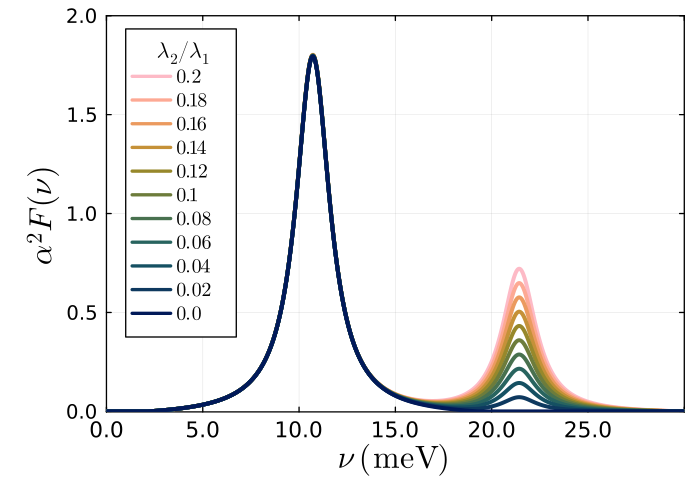

In [4]:
zmin = ω₀-ωcrit;    zmax = 2ω₀+ωcrit
zplotmin = 0;       zplotmax = zmax
@everywhere function α²F(z, ω₀, λ₀, λ₁, ϵ, ωcrit, zmin, zmax)
    function normalise(z, ω₀, λ₀, λ₁, ϵ, ωcrit)
        return (λ₀*ω₀/(2π))*(ϵ / ((z - ω₀)^2 + ϵ^2) - ϵ / (ωcrit^2 + ϵ^2)) * (ωcrit - abs(z - ω₀) > 0) + (λ₁*ω₀/(π))*(ϵ / ((z - 2ω₀)^2 + ϵ^2) - ϵ / (ωcrit^2 + ϵ^2)) * (ωcrit - abs(z - 2ω₀) > 0)
    end
    return ((λ₀+λ₁)/quadgk(x-> 2normalise(x, ω₀, λ₀, λ₁, ϵ, ωcrit)/x, zmin, zmax, rtol=1e-3, segbuf = alloc_segbuf(Float64, Float64, Float64))[1]).*normalise.(z, ω₀, λ₀, λ₁, ϵ, ωcrit)
end

z = LinRange(0,zmax, 1000)

plot(); xnames = 0:round(1000ω₀/2):999zplotmax

for i ∈ FL:-1:1

    plot!(z, α²F(z, ω₀, λ₀, F[i], ϵ, ωcrit, zplotmin, zplotmax), xlims = (zplotmin,zmax), xticks = (0:zplotmax/6:2zplotmax, xnames), xtickfontsize = 11, ylims = (-0.0025, ceil(maximum(α²F(z, ω₀, λ₀, F[i], ϵ, ωcrit, zplotmin, zplotmax)))), yticks = 0:0.5:25, ytickfontsize = 10, c = lcF[i], 
        lw = 3, gridopacity = 0.05, legend = false, label = false, xlabel = L"\nu\;(\textrm{meV})", ylabel = L"\alpha^2F(\nu)", xlabelfontsize = 16, ylabelfontsize = 16, size = (700,500), thickness_scaling = 1.33, fillrange=0, fillalpha=0, framestyle = :box
    )

end

ghost = ones(length(F))';   plot!(ghost, ghost, label = [L"%$j" for j=reverse((F[1:end]))'], lw = 2, c=reverse(lcF), legendtitle=L"\lambda_2/\lambda_1", legendfontsize=10, legendtitlefontsize=11, legendposition = :topleft)

plot!()

Critical temperature $T_c$

In [9]:
include("T_crit.jl")

Tc = T_crit(α²F, u, ωc, 1e-10, ω₀, λ₀, λ₁, ϵ, ωcrit, zmin, zmax)

12.26509149027828

Critical temperature for different values of $\lambda$

In [ ]:
@everywhere include("T_crit.jl")

λplot = 1e-10:0.005:1;     S = 0:0.02:0.2
Tcplot = SharedArray(zeros(length(λplot),length(S)));   i = SharedArray(zeros(1))

@sync @distributed for i ∈ 1:length(S)
    s = S[i];    j = 0
    for j ∈ 1:length(λplot)     
        λ0 = λplot[j];     λ1 = s*λ0
        Tcplot[j,i] = T_crit(α²F, u, ωc, 1e-3, ω₀, λ0, λ1, ϵ, ωcrit, zplotmin, zplotmax)
    end
end

save_object("T_c", Tcplot)

Superconducting band gap $\Delta(i\omega_m)$ for different temperatures $T$

In [ ]:
@everywhere include("Im_bandgap.jl")

N = Int64(round(ωc/(2π*kB*minimum(Tlist)*Tc)-1/2));     
Im_sol = SharedArray(zeros(2N, 2, L))

@sync @distributed for i ∈ 1:L

    t = Tlist[i]*Tc;     M = Int64(round(ωc/(2π*kB*t)-1/2))

    λ₁T = λ₁*(1+2nB(ω₀,t))

    @views Im_sol[1:2M,:,i] .= ImΔₘ(α²F, u, ωc, ω₀, λ₀, λ₁T, ϵ, ωcrit, t, 5000, zmin, zmax)

end

save_object("Im_sol",Im_sol)

Superconducting band gap $\Delta(i\omega_m)$ for different nonlinearity $\lambda_2$

In [ ]:
@everywhere include("Im_bandgap.jl"), include("T_crit.jl")

T = 3;  N = Int64(round(ωc/(2π*kB*T)-1/2));
Im_sol_λ = SharedArray(zeros(2N, 2, FL))

@sync @distributed for i ∈ 1:FL

    λ1 = F[i]*λ₀*(1+2nB(ω₀,T));

    @views Im_sol_λ[:,:,i] .= ImΔₘ(α²F, u, ωc, ω₀, λ₀, λ1, ϵ, ωcrit, T, 10000, zmin, zmax)

end

save_object("Im_sol_lambda",Im_sol_λ)

Superconducting gap function $\Delta(\omega+i\delta)$ for different temperatures $T$

In [ ]:
@everywhere include("Re_bandgap.jl")

Nω = 20000;  maxω = 0.5

Δₘ = Im_sol[:,1,:]
kₘ = Im_sol[:,2,:]

Re_sol = SharedArray(zeros(ComplexF64, 2Nω, 4, L))

@sync @distributed for i ∈ 1:L
 
    T = Tlist[i]*Tc;    maxiter = Int64(round(9sqrt(T)))

    λ₁T = λ₁*(1+2nB(ω₀,t))

    ωₘ = deleteat!(kₘ[:,i], kₘ[:,i].==0);        ImΔ = deleteat!(Δₘ[:,i], Δₘ[:,i].==0)

    @views Re_sol[:,:,i] .= ReΔ_f(α²F, u, ωc, ω₀, λ₀, λ₁T, ϵ, ωcrit, T, maxiter, Nω, 0.09, maxω, ωₘ, ImΔ, kB, zmin, zmax)

end

save_object("Re_sol",Re_sol)
save_object("Re_sol_c",Re_sol[1:20:end]) #Compress data file (good convergence only seems to be achieved with high amount of data points, but these are too many points for plotting)

Superconducting gap function $\Delta(\omega+i\delta)$ for different nonlinearity $\lambda_2$

In [ ]:
@everywhere include("Re_bandgap.jl")
@everywhere include("Re_bandgap_fast.jl")

Nω = 30000;  maxω = 0.5

Δₘ = Im_sol_λ[:,1,:]
kₘ = Im_sol_λ[:,2,:]

Re_sol_λ = SharedArray(zeros(ComplexF64, 2Nω, 4, FL))

T = 3

@sync @distributed for i ∈ 1:FL

    λ₁ = F[i]*λ₀*(1+2nB(ω₀,T))
    maxiter = 10
    ωₘ = kₘ[:,i];    ImΔ = Δₘ[:,i]

    @views Re_sol_λ[:,:,i] .= ReΔ_f(α²F, u, ωc, ω₀, λ₀, λ₁, ϵ, ωcrit, T, maxiter, Nω, 0.09, maxω, ωₘ, ImΔ, kB, zmin, zmax)

end

save_object("Re_sol_lambda",Re_sol_λ)
save_object("Re_sol_lambda_c",Re_sol_λ[1:30:end]) #Compress data file (good convergence only seems to be achieved with high amount of data points, but these are too many points for plotting)

### Figures

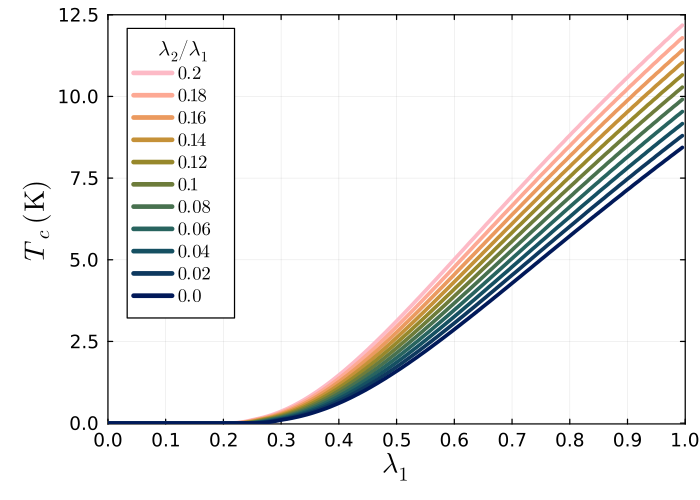

In [10]:
using Plots

plot(λplot, reverse(Tcplot, dims=2), label=[L"%$j" for j = reverse(S[1:end])'],
    legendtitle=L"\lambda_2/\lambda_1", legendfontsize=10, legendtitlefontsize=11, legendtitlehalign=:left, legendfonthalign=:left, legendposition = :topleft, c = reverse(lcF), 
    xlims = (0,1), ylims = (-0.025,12.5), xticks = 0:0.1:10, yticks = 0:2.5:25, xlabel=L"\lambda_1", ylabel=L"T_c\;(\textrm{K})", 
    xtickfontsize = 10, ytickfontsize = 10, lw = 3, xlabelfontsize = 15, ylabelfontsize = 15, gridopacity = 0.05,
    size = (700,500), thickness_scaling = 1.25, framestyle = :box
)

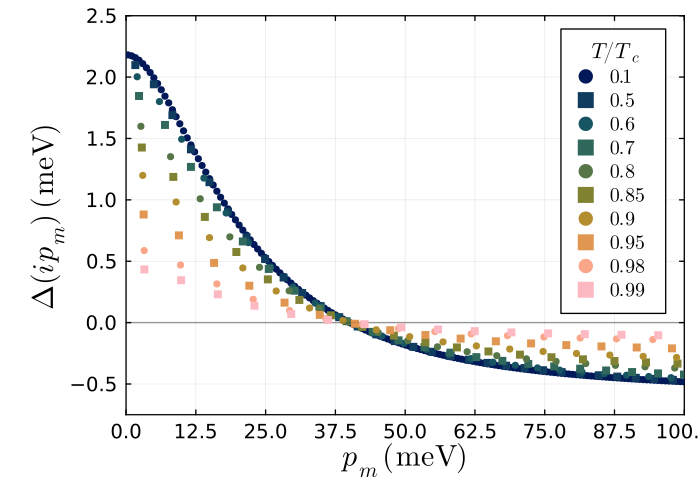

In [11]:
Δₘ = Im_sol[:,1,:]
m = [:circle, :rect]

plot()

for i ∈ 1:L

    T = Tlist[i]

    ωₘ = deleteat!(Im_sol[:,2,i], Im_sol[:,2,i].==0);   zero = zeros(length(ωₘ))

    plot!(1000ωₘ, zero, label = false; c = :black, lw = 1, linealpha = 0.05)

    scatter!(1000ωₘ, 1000Δₘ[:,i], label=L"%$T", shape = m[mod(i+1,2)+1],
        legendtitle=L"T/T_c", legendfontsize=10, legendtitlefontsize=11, legendtitlehalign=:left, legendfonthalign=:left,
        c=lc[i], ms=3, xlabel=L"p_m\:(\textrm{meV})", ylabel=L"\Delta(ip_m)\;(\textrm{meV})", xlims=(0,100), ylims=(-0.75,2.5),
        xticks=-1000:12.5:1000, yticks=-2.5:0.5:5, msw=0,size=(700,500), thickness_scaling = 1.33, framestyle = :box, gridopacity = 0.05,
        xlabelfontsize = 15, ylabelfontsize = 15, xtickfontsize = 10, ytickfontsize = 10
    )

end

plot!()

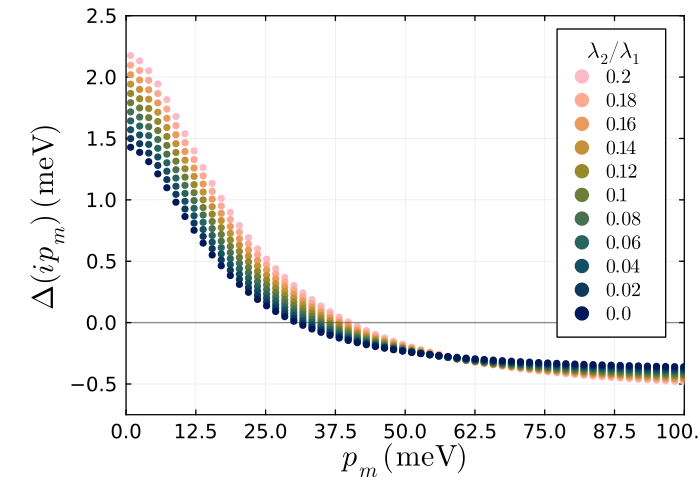

In [12]:
m = [:circle]

plot()

for i ∈ 1:FL

    T = F[FL+1-i]

    ωₘ = Im_sol_λ[:,2,FL+1-i];   
    Δₘ = Im_sol_λ[:,1,FL+1-i]
    
    ωplot = deleteat!(ωₘ, ωₘ .== 0)
    zero = zeros(length(ωplot))
    Δplot = deleteat!(Δₘ, Δₘ .== 0)

    plot!(1000ωplot, zero, label = false; c = :black, lw = 1, linealpha = 0.05)

    scatter!(1000ωplot, 1000Δplot, label=L"%$T", shape = :circle,
        legendtitle=L"\lambda_2/\lambda_1", legendfontsize=10, legendtitlefontsize=11, legendtitlehalign=:left, legendfonthalign=:left,
        c=lcF[FL+1-i], ms=3, xlabel=L"p_m\:(\textrm{meV})", ylabel=L"\Delta(ip_m)\;(\textrm{meV})", xlims=(0,100), ylims=(-0.75,2.5),
        xticks=-1000:12.5:1000, yticks=-2.5:0.5:5, msw=0,size=(700,500), thickness_scaling = 1.33, framestyle = :box, gridopacity = 0.05,
        xlabelfontsize = 15, ylabelfontsize = 15, xtickfontsize = 10, ytickfontsize = 10
    )

end

plot!()

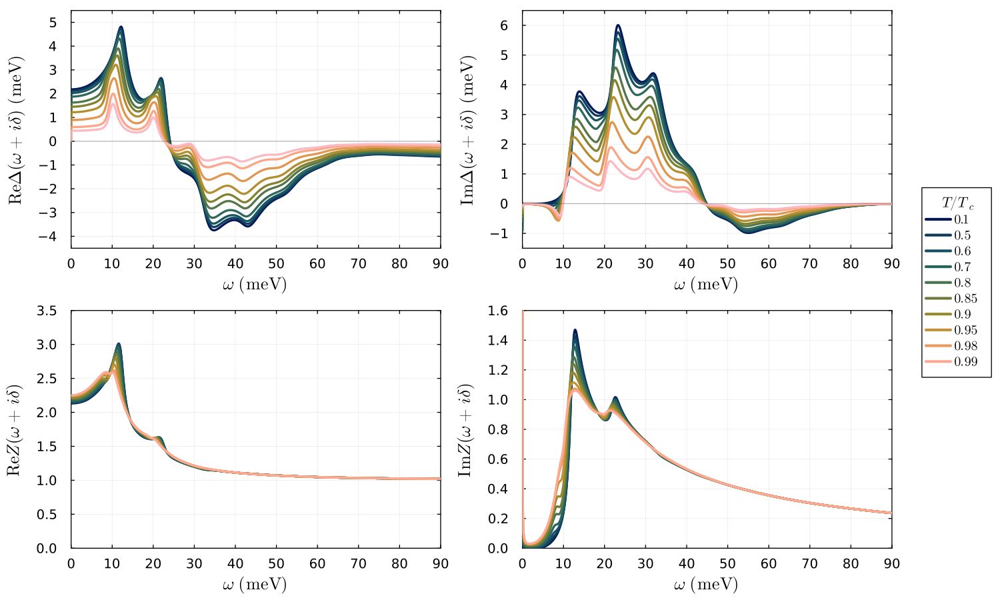

In [17]:
Re_Δ = Re_sol[:,1,:];           scale = 1
Re_Z = Re_sol[:,3,:]

symm = 0;       lims = 90

ω = real.(Re_sol[1:scale:end,4,1]);   zero = zeros(length(ω))
Δ = Re_Δ[1:scale:end,:];      Z = Re_Z[1:scale:end,:];  C = lcF

Xlabel = L"\omega\:\:(\textrm{meV})"
Ylabel = [L"\textrm{Re}\Delta(\omega+i\delta)\:\:(\textrm{meV})" L"\textrm{Im}\Delta(\omega+i\delta)\:\:(\textrm{meV})" L"\textrm{Re}Z(\omega+i\delta)" L"\textrm{Im}Z(\omega+i\delta)"]

p1 = plot(1000ω, 1000real.(Δ), label = false, c = lc, framestyle = :box, xlims=(-lims*symm,lims), ylims = (-4.5,5.5), xlabel = Xlabel, ylabel = Ylabel[1], yticks = -10:10)
p2 = plot(1000ω, 1000imag.(Δ), label = false, c = lc, framestyle = :box, xlims=(-lims*symm,lims), ylims = (-1.5,6.5), xlabel = Xlabel, ylabel = Ylabel[2], yticks = -10:10)
p3 = plot(1000ω, real.(Z), label = false, c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (0,3.5), xlabel = Xlabel, ylabel = Ylabel[3], yticks = -10:0.5:10)
p4 = plot(1000ω, imag.(Z), label = [L"%$j" for j = Tlist[1:end]'], c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (-1.6symm,1.6), xlabel = Xlabel, ylabel = Ylabel[4], yticks = -10:0.2:10, legendtitle = L"T/T_c", legendfontsize = 10)
pempty = plot(0, 0, xaxis = false, yaxis = false, grid = false)

plot(p1, p2, p3, p4, pempty, pempty, thickness_scaling=1.33, size = (1500,900), xticks = -1000:10:1000, legend = (1.17,1.45),
    lw = 2.5, gridopacity = 0.05, xlabelfontsize = 13, ylabelfontsize = 13, xtickfontsize = 10, ytickfontsize = 10, layout= @layout [ [grid(2,2)]  grid(10,1){0.04w}]
)

plot!([1000ω, 1000ω], [zero, zero], label = false, c=:black, lw = 1, linealpha = 0.25)

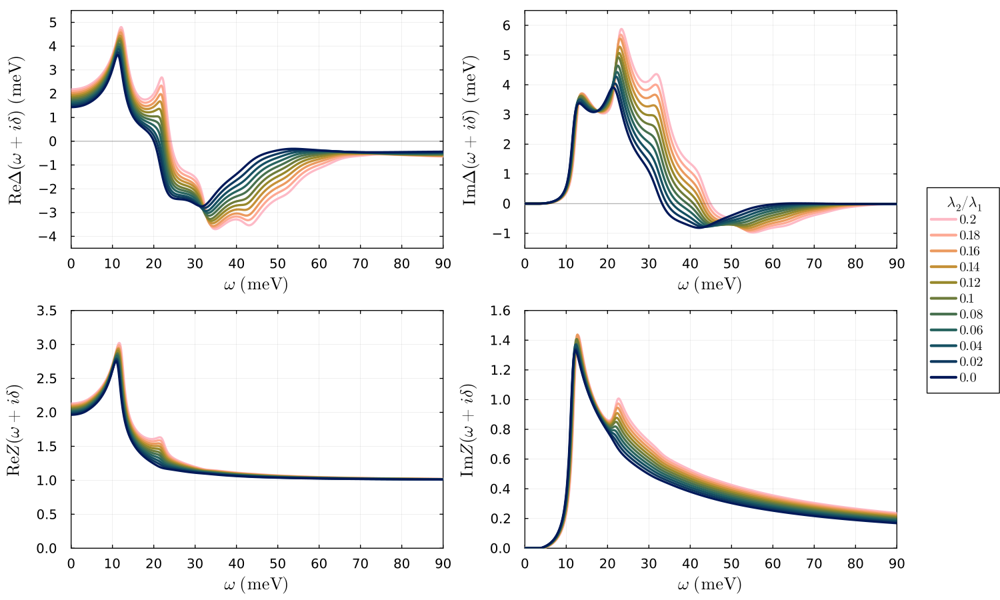

In [19]:
Re_Δ = Re_sol_λ[:,1,:];         scale = 1
Re_Z = Re_sol_λ[:,3,:]

symm = 0;       lims = 90

ω = real.(Re_sol_λ[1:scale:end,4,1]);         zero = zeros(length(ω))
Δ = reverse(Re_Δ[1:scale:end,:],dims=2);      Z = reverse(Re_Z[1:scale:end,:],dims=2);  C = reverse(lcF)

Xlabel = L"\omega\:\:(\textrm{meV})"
Ylabel = [L"\textrm{Re}\Delta(\omega+i\delta)\:\:(\textrm{meV})" L"\textrm{Im}\Delta(\omega+i\delta)\:\:(\textrm{meV})" L"\textrm{Re}Z(\omega+i\delta)" L"\textrm{Im}Z(\omega+i\delta)" L"|\Delta(\omega+i\delta)|\;(\textrm{meV})" L"\textrm{Arg}[\Delta(\omega+i\delta)]"]
ynames = [L"0" L"\frac{\pi}{2}" L"\pi" L"\frac{3\pi}{2}" L"2\pi"]

p1 = plot(1000ω, 1000real.(Δ), label = false, c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (-4.5,5.5), xlabel = Xlabel, ylabel = Ylabel[1], yticks = -10:10, ytickfontsize = 10)
p2 = plot(1000ω, 1000imag.(Δ), label = false, c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (-1.5,6.5), xlabel = Xlabel, ylabel = Ylabel[2], yticks = -10:10, ytickfontsize = 10)
p3 = plot(1000ω, real.(Z), label = false, c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (0,3.5), xlabel = Xlabel, ylabel = Ylabel[3], yticks = -10:0.5:10, ytickfontsize = 10)
p4 = plot(1000ω, imag.(Z), label = [L"%$j" for j = F[end:-1:1]'], c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (-1.6symm,1.6), xlabel = Xlabel, ylabel = Ylabel[4], yticks = -10:0.2:10, 
        legendtitle = L"\lambda_2/\lambda_1", legendfontsize = 10, ytickfontsize = 10)
pempty = plot(0, 0, xaxis = false, yaxis = false, grid = false)
p5 = plot(1000ω, 1000sqrt.(abs2.(Δ)), c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (0,6.5), xlabel = L"\omega\;(\textrm{meV})", 
        ylabel = Ylabel[5], yticks = -10:10, lw = 2.5, label = false, ytickfontsize = 10)
p6 = plot(1000ω, mod.(angle.(Δ.+im*1e-5),2π), c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (0,2π), xlabel = L"\omega\;(\textrm{meV})", 
        ylabel = Ylabel[6] , yticks = (0:π/2:2π, ynames), lw = 2.5, label = false, ytickfontsize = 12)

plot(p1, p2, p3, p4, pempty, pempty, thickness_scaling=1.33, size = (1500,900), xticks = -1000:10:1000, legend = (1.17,1.45),
    lw = 2.5, gridopacity = 0.05, xlabelfontsize = 13, ylabelfontsize = 13, xtickfontsize = 10, layout = @layout [ [grid(2,2)]  grid(10,1){0.04w}]
)

plot!([1000ω, 1000ω], [zero, zero], label = false, c=:black, lw = 1, linealpha = 0.25)

#savefig("C:/Uni/Papers/Ingvar/Real_solutions_lambda.svg");  savefig("Real_solutions_lambda.svg")

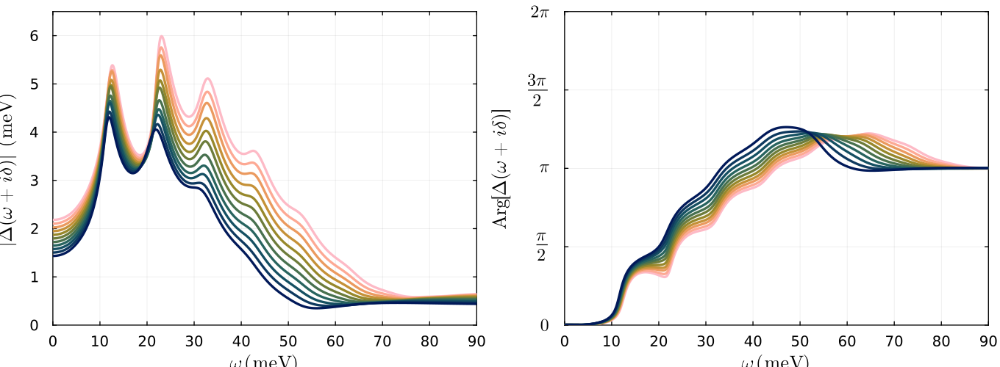

In [21]:
Re_Δ = Re_sol_λ[:,1,:];         scale = 1

symm = 0;       lims = 90

ω = real.(Re_sol_λ[1:scale:end,4,1]);        zero = zeros(length(ω))
Δ = reverse(Re_Δ[1:scale:end,:],dims=2);     ynames = [L"0" L"\frac{\pi}{2}" L"\pi" L"\frac{3\pi}{2}" L"2\pi"]

p = plot(1000ω, 1000sqrt.(abs2.(Δ)), c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (0,6.5), xlabel = L"\omega\;(\textrm{meV})", 
        ylabel = L"|\Delta(\omega+i\delta)|\;(\textrm{meV})", yticks = -10:10, lw = 2.5, label = false, ytickfontsize = 10, xtickfontsize = 10)
p2 = plot(1000ω, mod.(angle.(Δ.+im*1e-5),2π), c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (0,2π), xlabel = L"\omega\;(\textrm{meV})", 
        ylabel = L"\textrm{Arg}[\Delta(\omega+i\delta)]", yticks = (0:π/2:2π, ynames), lw = 2.5, label = false, ytickfontsize = 12, xtickfontsize = 10)

plot(p, p2, thickness_scaling=1.33, size = (1360,500), xticks = -1000:10:1000, layout = (1,2),
    gridopacity = 0.05, xlabelfontsize = 13, ylabelfontsize = 13
)